# HPO with DeepHyper

## Imports and GPU Detection <a class="anchor" id="imports-and-gpu-detection"></a>

<div class="alert alert-warning">

<b>Warning</b>
    
By design asyncio does not allow nested event loops. Jupyter is using Tornado which already starts an event loop. Therefore the following patch is required to run this tutorial.
    
</div>

In [385]:
import shap

In [386]:
#!pip install nest_asyncio

import nest_asyncio
nest_asyncio.apply()

In [387]:
import json
import os
import pathlib
import shutil

!export TF_CPP_MIN_LOG_LEVEL=3
!export TF_XLA_FLAGS=--tf_xla_enable_xla_devices

import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
from tqdm import tqdm

<div class="alert alert-info">
    
<b>Note</b>
    
The `TF_CPP_MIN_LOG_LEVEL` can be used to avoid the logging of Tensorflow *DEBUG*, *INFO* and *WARNING* statements.
    
</div>

<div class="alert alert-info">
    
<b>Note</b>
    
The following can be used to detect if **GPU** devices are available on the current host.
    
</div>

In [388]:
import math
import random
def f(config):
    val = - config["x"]**2
    if random.random() < 0.1:
        val = math.nan
    return val

In [389]:
import pandas as pd
#real_data = pd.read_csv('../data/1000genome-chameleon.csv')
real_data = pd.read_csv('./qmcpack/S8_problem.csv')

In [390]:
real_data.fillna('', inplace=True)

In [391]:
real_data.head()

,# of threads,C2ROMPT_threadlimit,AAOMPT.h threadlimit,ABOMPT.h threadlimit,C2ROMPT_chunksize,AAOMPT.h chunksize,ABOMPT.h chunksize,objective,elapsed_sec
0,13,thread_limit(192),thread_limit(192),thread_limit(192),512,512,768,-52.399428,353.911634
1,28,thread_limit(192),thread_limit(128),,768,384,192,-51.317158,725.829059
2,10,thread_limit(256),thread_limit(64),thread_limit(128),128,384,768,-51.068369,1083.676043
3,60,,,,384,384,384,-35.793604,1589.592661
4,40,thread_limit(64),thread_limit(128),thread_limit(64),512,384,768,-46.647371,2004.036815


In [392]:
print(real_data)

    # of threads C2ROMPT_threadlimit AAOMPT.h threadlimit  \
0             13  thread_limit(192)    thread_limit(192)    
1             28  thread_limit(192)    thread_limit(128)    
2             10  thread_limit(256)     thread_limit(64)    
3             60                                            
4             40   thread_limit(64)    thread_limit(128)    
5             36  thread_limit(128)    thread_limit(256)    
6             12   thread_limit(64)    thread_limit(128)    
7             27  thread_limit(192)                         
8             27  thread_limit(192)                         
9              6  thread_limit(192)     thread_limit(64)    
10            13  thread_limit(192)                         
11            20  thread_limit(192)                         
12            15  thread_limit(192)                         
13            19  thread_limit(192)                         
14            16  thread_limit(192)                         
15            13  thread

In [393]:
objective = 'objective'

In [394]:

real_data['objective'] = real_data[objective] * -1

In [395]:
real_data.head()

,# of threads,C2ROMPT_threadlimit,AAOMPT.h threadlimit,ABOMPT.h threadlimit,C2ROMPT_chunksize,AAOMPT.h chunksize,ABOMPT.h chunksize,objective,elapsed_sec
0,13,thread_limit(192),thread_limit(192),thread_limit(192),512,512,768,52.399428,353.911634
1,28,thread_limit(192),thread_limit(128),,768,384,192,51.317158,725.829059
2,10,thread_limit(256),thread_limit(64),thread_limit(128),128,384,768,51.068369,1083.676043
3,60,,,,384,384,384,35.793604,1589.592661
4,40,thread_limit(64),thread_limit(128),thread_limit(64),512,384,768,46.647371,2004.036815


In [396]:
#real_df = df.loc[df['objective'] < q_10]
real_data = real_data.drop(columns=['elapsed_sec'])

In [397]:
real_data.head()

,# of threads,C2ROMPT_threadlimit,AAOMPT.h threadlimit,ABOMPT.h threadlimit,C2ROMPT_chunksize,AAOMPT.h chunksize,ABOMPT.h chunksize,objective
0,13,thread_limit(192),thread_limit(192),thread_limit(192),512,512,768,52.399428
1,28,thread_limit(192),thread_limit(128),,768,384,192,51.317158
2,10,thread_limit(256),thread_limit(64),thread_limit(128),128,384,768,51.068369
3,60,,,,384,384,384,35.793604
4,40,thread_limit(64),thread_limit(128),thread_limit(64),512,384,768,46.647371


In [398]:
#print('non-unique columns:')
#[e for e in real_df.columns if real_df[e].nunique() != 1]

(array([ 1.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,  3., 55.]),
 array([ 0.        ,  5.28883492, 10.57766985, 15.86650477, 21.1553397 ,
        26.44417462, 31.73300955, 37.02184447, 42.3106794 , 47.59951432,
        52.88834925]),
 <BarContainer object of 10 artists>)

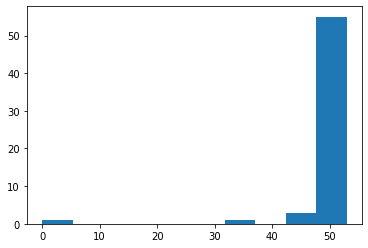

In [399]:
plt.hist(real_data.objective.values)

In [400]:
#real_df_cut = real_df#[real_df.objective < 1000.00]

In [401]:
#real_df_cut

In [402]:
from sklearn.base import BaseEstimator, TransformerMixin

class IdentityTransformer(BaseEstimator, TransformerMixin):
    def __init__(self):
        pass
    
    def fit(self, input_array, y=None):
        return self
    
    def transform(self, input_array, y=None):
        return input_array*1

In [403]:
real_data.columns.to_list()

['# of threads',
 'C2ROMPT_threadlimit',
 'AAOMPT.h threadlimit',
 'ABOMPT.h threadlimit',
 'C2ROMPT_chunksize',
 'AAOMPT.h chunksize',
 'ABOMPT.h chunksize',
 'objective']

In [404]:
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor
from sklearn import linear_model
from sklearn.metrics import r2_score
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler,OneHotEncoder, MinMaxScaler
import skopt
from sklearn.compose import ColumnTransformer
from sklearn.neighbors import KNeighborsRegressor

cat_vars = ['C2ROMPT_threadlimit', 'AAOMPT.h threadlimit', 'ABOMPT.h threadlimit',
            'C2ROMPT_chunksize','AAOMPT.h chunksize','ABOMPT.h chunksize']

num_vars= ['# of threads']

response_vars = ['objective']

num_pipeline = Pipeline([
    ('identity',IdentityTransformer())
    #('std_scaler', StandardScaler()),
    #('minmax_scaler', MinMaxScaler()),
])

data_pipeline = ColumnTransformer([
    ('objective', num_pipeline, response_vars),
    ('numerical', num_pipeline, num_vars),
    #('categorical', OneHotEncoder(sparse=False), cat_vars),
])

In [405]:
real_data.head()

,# of threads,C2ROMPT_threadlimit,AAOMPT.h threadlimit,ABOMPT.h threadlimit,C2ROMPT_chunksize,AAOMPT.h chunksize,ABOMPT.h chunksize,objective
0,13,thread_limit(192),thread_limit(192),thread_limit(192),512,512,768,52.399428
1,28,thread_limit(192),thread_limit(128),,768,384,192,51.317158
2,10,thread_limit(256),thread_limit(64),thread_limit(128),128,384,768,51.068369
3,60,,,,384,384,384,35.793604
4,40,thread_limit(64),thread_limit(128),thread_limit(64),512,384,768,46.647371


In [406]:
real_data_num = real_data[['objective','# of threads']]

In [407]:
real_data_num.head()

,objective,# of threads
0,52.399428,13
1,51.317158,28
2,51.068369,10
3,35.793604,60
4,46.647371,40


In [408]:
encoder=OneHotEncoder(sparse=False)

real_data_cat_encoded = pd.DataFrame (encoder.fit_transform(real_data[cat_vars]))

real_data_cat_encoded.columns = encoder.get_feature_names(cat_vars)

#real_data_cat.drop(cat_vars ,axis=1, inplace=True)

#OH_X_train= pd.concat([real_data, train_X_encoded ], axis=1)

Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.


In [409]:
data_pipeline_model = data_pipeline.fit(real_data_num)

In [410]:
objective_pipe = Pipeline([('identity', StandardScaler())])

In [411]:
objective_pipe.fit(real_data_num['objective'].values.reshape(-1, 1))

Pipeline(steps=[('identity', StandardScaler())])

In [412]:
#num_data = pd.DataFrame(data_pipeline_model.transform(real_data_num), columns=['objective''# of threads'])

In [413]:
num_data = data_pipeline_model.transform(real_data_num)

In [414]:
num_data

array([[52.39942778, 13.        ],
       [51.31715808, 28.        ],
       [51.0683693 , 10.        ],
       [35.79360379, 60.        ],
       [46.64737096, 40.        ],
       [49.18866677, 36.        ],
       [52.07155396, 12.        ],
       [51.5491396 , 27.        ],
       [51.61738016, 27.        ],
       [44.1069148 ,  6.        ],
       [52.42215283, 13.        ],
       [52.11027763, 20.        ],
       [52.29627707, 15.        ],
       [52.24937052, 19.        ],
       [52.26349014, 16.        ],
       [52.33760189, 13.        ],
       [52.66310859, 15.        ],
       [51.91333104, 13.        ],
       [52.88834925, 15.        ],
       [52.29684272, 15.        ],
       [52.60466533, 15.        ],
       [52.56863278, 15.        ],
       [52.73490756, 15.        ],
       [52.46253838, 15.        ],
       [52.43409138, 15.        ],
       [51.44164273, 28.        ],
       [52.05921938, 19.        ],
       [52.61955031, 15.        ],
       [52.53550357,

In [415]:
real_data_cat_encoded.to_numpy()

array([[0., 0., 1., ..., 0., 1., 0.],
       [0., 0., 1., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 1., 0.],
       ...,
       [1., 0., 0., ..., 1., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 1., ..., 0., 0., 0.]])

In [416]:
preprocessed_data = np.concatenate((num_data, real_data_cat_encoded.to_numpy()), axis=1)

In [417]:
#preprocessed_data= pd.concat([num_data, real_data_cat_encoded ], axis=1)

In [418]:
preprocessed_data.shape

(60, 38)

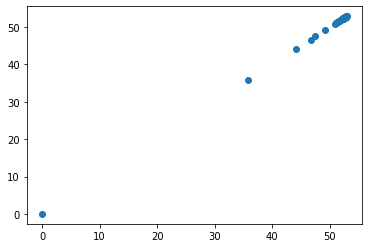

In [419]:
plt.scatter(preprocessed_data[:,0],real_data_num['objective'].values)

In [420]:
regr = RandomForestRegressor()
#regr.fit(preprocessed_data[:,1:],preprocessed_data[:,0])

In [421]:
from sklearn.model_selection import cross_val_score

In [422]:
preprocessed_data

array([[52.39942778, 13.        ,  0.        , ...,  0.        ,
         1.        ,  0.        ],
       [51.31715808, 28.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [51.0683693 , 10.        ,  0.        , ...,  0.        ,
         1.        ,  0.        ],
       ...,
       [52.34950195, 15.        ,  1.        , ...,  1.        ,
         0.        ,  0.        ],
       [52.81209381, 16.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [-0.        , 17.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ]])

In [423]:
cv_scores = cross_val_score(regr, preprocessed_data[:,1:],preprocessed_data[:,0], cv=10)

In [424]:
preprocessed_data.shape

(60, 38)

In [425]:
print(cv_scores)

[ -0.40526885 -10.70320503  -0.28250071  -3.72100772  -5.20305797
 -23.86070354  -9.36325646   0.84899641  -5.65335922  -0.17433365]


In [426]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(preprocessed_data[:,1:], preprocessed_data[:,0], test_size=0.50, 
                                                    random_state=42)

In [427]:
X_train.shape

(30, 37)

In [428]:
regr.fit(X_train,y_train)

RandomForestRegressor()

0.0010139789639426189


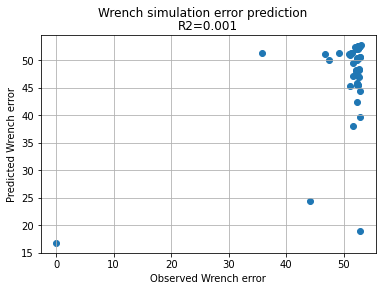

In [429]:
preds = regr.predict(preprocessed_data[:,1:])
plt.scatter(preprocessed_data[:,0],preds)
r2 = r2_score(preprocessed_data[:,0],preds)
print(r2)
plt.ylabel('Predicted Wrench error')
plt.xlabel('Observed Wrench error')
plt.suptitle('Wrench simulation error prediction')
plt.title('R2=%1.3f'%r2)
plt.grid()

In [430]:
input_names = real_data.columns.to_list()[:-1]

In [431]:
input_names_new = ['# of threads'] + real_data_cat_encoded.columns.to_list()

In [432]:
len(a)

37

In [433]:
#sorted_idx = regr.feature_importances_.argsort()

In [434]:
#print(sorted_idx)
#print(input_names)

In [435]:
#input_names_new = []
#for inp in input_names:
 #   k = inp.split('::')[2]
  #  input_names_new.append(k)

In [436]:
input_names = input_names_new

In [437]:
import shap

In [438]:
explainer = shap.TreeExplainer(regr)
shap_values = explainer.shap_values(preprocessed_data[:,1:])

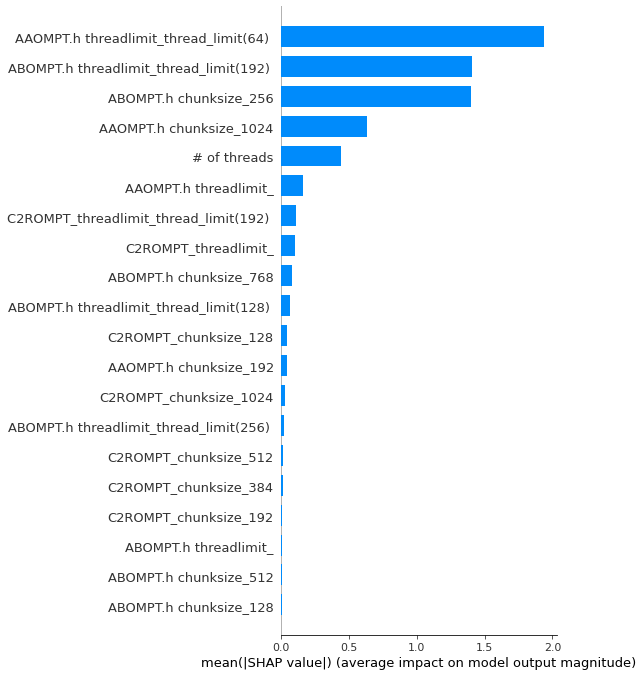

In [439]:
shap.summary_plot(shap_values, feature_names = input_names, plot_type="bar")

In [381]:
X_test1 = pd.DataFrame(preprocessed_data[:,1:])
X_test1.columns = input_names

In [382]:
print(X_test1)

    # of threads  C2ROMPT_threadlimit_  \
0           13.0                   0.0   
1           28.0                   0.0   
2           10.0                   0.0   
3           60.0                   1.0   
4           40.0                   0.0   
5           36.0                   0.0   
6           12.0                   0.0   
7           27.0                   0.0   
8           27.0                   0.0   
9            6.0                   0.0   
10          13.0                   0.0   
11          20.0                   0.0   
12          15.0                   0.0   
13          19.0                   0.0   
14          16.0                   0.0   
15          13.0                   0.0   
16          15.0                   0.0   
17          13.0                   0.0   
18          15.0                   1.0   
19          15.0                   0.0   
20          15.0                   0.0   
21          15.0                   0.0   
22          15.0                  

In [383]:
import random
random_indices = random.sample(range(X_test1.shape[0]),30)

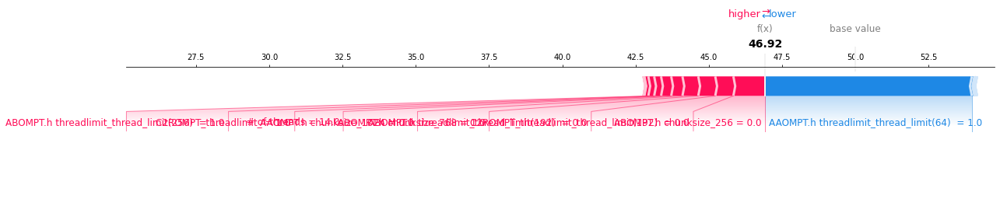

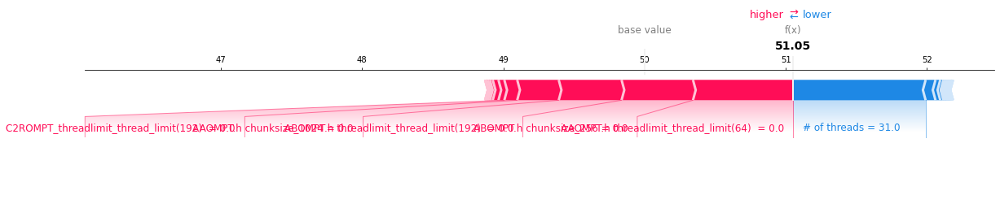

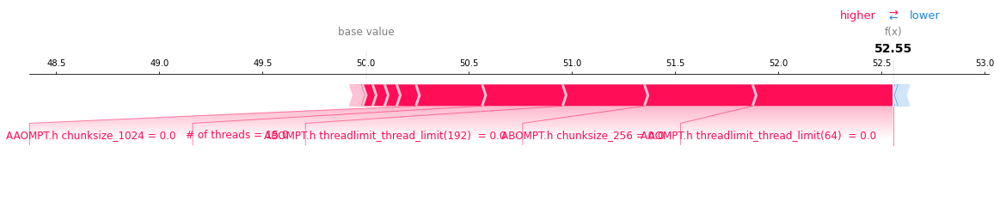

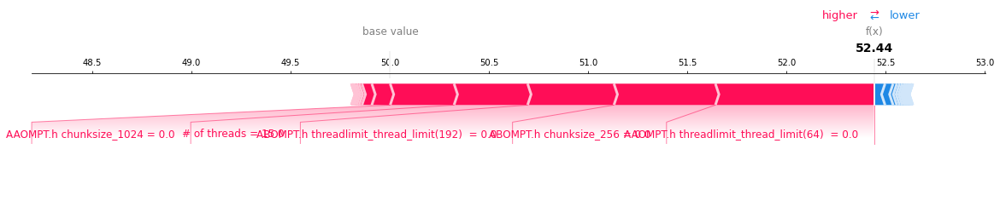

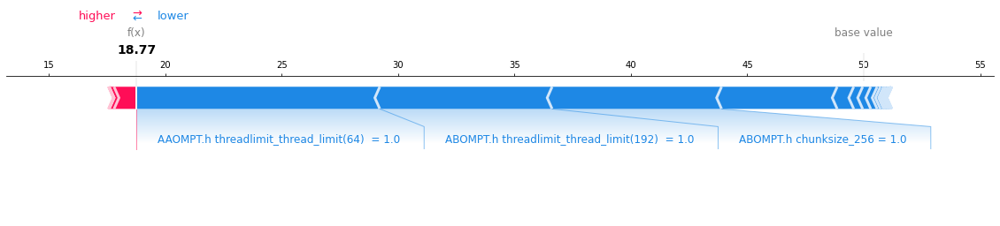

...

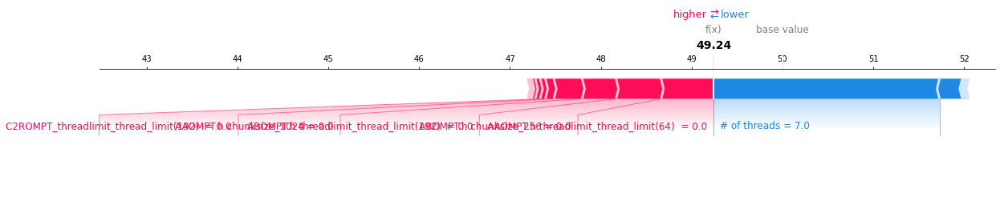

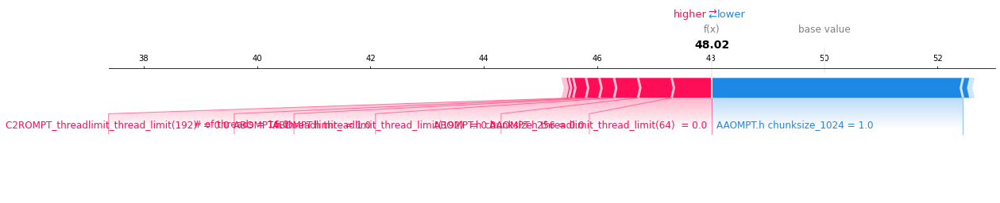

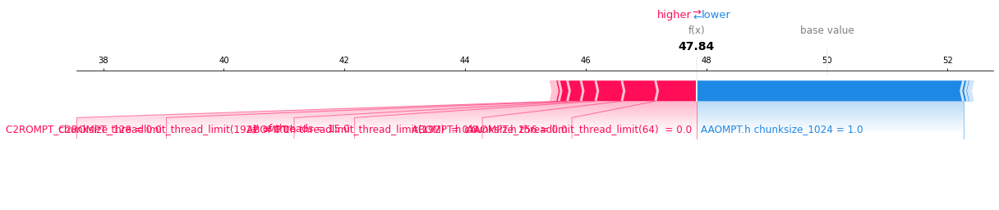

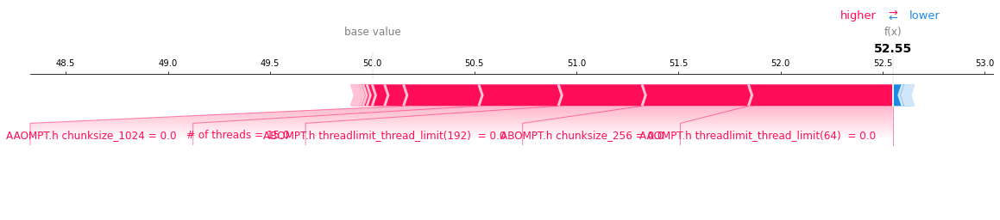

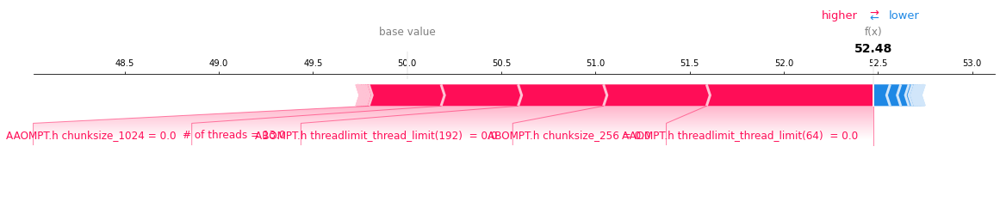

In [384]:
for i in random_indices: 
    choosen_instance = X_test1.loc[[i]]
    shap_values = explainer.shap_values(choosen_instance)
    shap.initjs()
    shap.force_plot(explainer.expected_value, shap_values, choosen_instance,matplotlib=True)